<a href="https://colab.research.google.com/github/Crinmatic/AI-world/blob/main/Yor_SR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#@title Download Tacotron 2
#%tensorflow_version 1.15
import os
#!git clone -q https://github.com/NVIDIA/tacotron2
#!cp -r tacotron2 /content/drive/MyDrive/"Speech Recognition"
os.chdir('/content/drive/MyDrive/Speech Recognition/tacotron2/dataset/')
!git submodule init
!git submodule update
!pip install -q unidecode tensorboardX

     |████████████████████████████████| 236 kB 9.0 MB/s 
     |████████████████████████████████| 125 kB 71.9 MB/s 


In [ ]:
%pip install tensorflow==1.15

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-probability 0.16.0 requires gast>=0.3.2, but you have gast 0.2.2 which is incompatible.
kapre 0.3.7 requires tensorflow>=2.0.0, but you have tensorflow 1.15.0 which is incompatible.


In [ ]:
!cd /content/drive/MyDrive/"Speech Recognition"/tacotron2

In [ ]:
!unzip /content/drive/MyDrive/"Speech Recognition"/tacotron2/dataset/yorubaspeechcorpus.zip?sequence=3

In [ ]:
!pwd

/content/drive/MyDrive/Speech Recognition/tacotron2


In [ ]:
%matplotlib inline
import os
if os.getcwd() != '/content/drive/MyDrive/Speech Recognition/tacotron2':
    os.chdir('/content/drive/MyDrive/Speech Recognition/tacotron2')

In [ ]:


import time
import argparse
import math
from numpy import finfo

import torch
from distributed import apply_gradient_allreduce
import torch.distributed as dist
from torch.utils.data.distributed import DistributedSampler
from torch.utils.data import DataLoader


from model import Tacotron2
from data_utils import TextMelLoader, TextMelCollate
from loss_function import Tacotron2Loss
from logger import Tacotron2Logger
from hparams import create_hparams
 
import random
import numpy as np

import layers
from utils import load_wav_to_torch, load_filepaths_and_text
from text import text_to_sequence
from math import e
#from tqdm import tqdm # Terminal
#from tqdm import tqdm_notebook as tqdm # Legacy Notebook TQDM
from tqdm.notebook import tqdm # Modern Notebook TQDM
from distutils.dir_util import copy_tree
import matplotlib.pylab as plt

In [ ]:
#title Training Model


def download_from_google_drive(file_id, file_name):
  # download a file from the Google Drive link
  !rm -f ./cookie
  !curl -c ./cookie -s -L "https://drive.google.com/uc?export=download&id={file_id}" > /dev/null
  confirm_text = !awk '/download/ {print $NF}' ./cookie
  confirm_text = confirm_text[0]
  !curl -Lb ./cookie "https://drive.google.com/uc?export=download&confirm={confirm_text}&id={file_id}" -o {file_name}

def create_mels():
    print("Generating Mels")
    stft = layers.TacotronSTFT(
                hparams.filter_length, hparams.hop_length, hparams.win_length,
                hparams.n_mel_channels, hparams.sampling_rate, hparams.mel_fmin,
                hparams.mel_fmax)
    def save_mel(filename):
        audio, sampling_rate = load_wav_to_torch(filename)
        if sampling_rate != stft.sampling_rate:
            raise ValueError("{} {} SR doesn't match target {} SR".format(filename, 
                sampling_rate, stft.sampling_rate))
        audio_norm = audio / hparams.max_wav_value
        audio_norm = audio_norm.unsqueeze(0)
        audio_norm = torch.autograd.Variable(audio_norm, requires_grad=False)
        melspec = stft.mel_spectrogram(audio_norm)
        melspec = torch.squeeze(melspec, 0).cpu().numpy()
        np.save(filename.replace('.wav', ''), melspec)

    import glob
    wavs = glob.glob('wavs/*.wav')
    for i in tqdm(wavs):
        save_mel(i)


def reduce_tensor(tensor, n_gpus):
    rt = tensor.clone()
    dist.all_reduce(rt, op=dist.reduce_op.SUM)
    rt /= n_gpus
    return rt


def init_distributed(hparams, n_gpus, rank, group_name):
    assert torch.cuda.is_available(), "Distributed mode requires CUDA."
    print("Initializing Distributed")

    # Set cuda device so everything is done on the right GPU.
    torch.cuda.set_device(rank % torch.cuda.device_count())

    # Initialize distributed communication
    dist.init_process_group(
        backend=hparams.dist_backend, init_method=hparams.dist_url,
        world_size=n_gpus, rank=rank, group_name=group_name)

    print("Done initializing distributed")


def prepare_dataloaders(hparams):
    # Get data, data loaders and collate function ready
    trainset = TextMelLoader(hparams.training_files, hparams)
    valset = TextMelLoader(hparams.validation_files, hparams)
    collate_fn = TextMelCollate(hparams.n_frames_per_step)

    if hparams.distributed_run:
        train_sampler = DistributedSampler(trainset)
        shuffle = False
    else:
        train_sampler = None
        shuffle = True

    train_loader = DataLoader(trainset, num_workers=1, shuffle=shuffle,
                              sampler=train_sampler,
                              batch_size=hparams.batch_size, pin_memory=False,
                              drop_last=True, collate_fn=collate_fn)
    return train_loader, valset, collate_fn


def prepare_directories_and_logger(output_directory, log_directory, rank):
    if rank == 0:
        if not os.path.isdir(output_directory):
            os.makedirs(output_directory)
            os.chmod(output_directory, 0o775)
        logger = Tacotron2Logger(os.path.join(output_directory, log_directory))
    else:
        logger = None
    return logger


def load_model(hparams):
    model = Tacotron2(hparams).cuda()
    if hparams.fp16_run:
        model.decoder.attention_layer.score_mask_value = finfo('float16').min

    if hparams.distributed_run:
        model = apply_gradient_allreduce(model)

    return model


def warm_start_model(checkpoint_path, model, ignore_layers):
    assert os.path.isfile(checkpoint_path)
    print("Warm starting model from checkpoint '{}'".format(checkpoint_path))
    checkpoint_dict = torch.load(checkpoint_path, map_location='cpu')
    model_dict = checkpoint_dict['state_dict']
    if len(ignore_layers) > 0:
        model_dict = {k: v for k, v in model_dict.items()
                      if k not in ignore_layers}
        dummy_dict = model.state_dict()
        dummy_dict.update(model_dict)
        model_dict = dummy_dict
    model.load_state_dict(model_dict)
    return model


def load_checkpoint(checkpoint_path, model, optimizer):
    assert os.path.isfile(checkpoint_path)
    print("Loading checkpoint '{}'".format(checkpoint_path))
    checkpoint_dict = torch.load(checkpoint_path, map_location='cpu')
    model.load_state_dict(checkpoint_dict['state_dict'])
    optimizer.load_state_dict(checkpoint_dict['optimizer'])
    learning_rate = checkpoint_dict['learning_rate']
    iteration = checkpoint_dict['iteration']
    print("Loaded checkpoint '{}' from iteration {}" .format(
        checkpoint_path, iteration))
    return model, optimizer, learning_rate, iteration


def save_checkpoint(model, optimizer, learning_rate, iteration, filepath):
    print("Saving model and optimizer state at iteration {} to {}".format(
        iteration, filepath))
    try:
        torch.save({'iteration': iteration,
                'state_dict': model.state_dict(),
                'optimizer': optimizer.state_dict(),
                'learning_rate': learning_rate}, filepath)
    except KeyboardInterrupt:
        print("interrupt received while saving, waiting for save to complete.")
        torch.save({'iteration': iteration,'state_dict': model.state_dict(),'optimizer': optimizer.state_dict(),'learning_rate': learning_rate}, filepath)
    print("Model Saved")

def plot_alignment(alignment, info=None):
    %matplotlib inline
    fig, ax = plt.subplots(figsize=(int(alignment_graph_width/100), int(alignment_graph_height/100)))
    im = ax.imshow(alignment, cmap='inferno', aspect='auto', origin='lower',
                   interpolation='none')
    ax.autoscale(enable=True, axis="y", tight=True)
    fig.colorbar(im, ax=ax)
    xlabel = 'Decoder timestep'
    if info is not None:
        xlabel += '\n\n' + info
    plt.xlabel(xlabel)
    plt.ylabel('Encoder timestep')
    plt.tight_layout()
    fig.canvas.draw()
    plt.show()

def validate(model, criterion, valset, iteration, batch_size, n_gpus,
             collate_fn, logger, distributed_run, rank, epoch, start_eposh, learning_rate):
    """Handles all the validation scoring and printing"""
    model.eval()
    with torch.no_grad():
        val_sampler = DistributedSampler(valset) if distributed_run else None
        val_loader = DataLoader(valset, sampler=val_sampler, num_workers=1,
                                shuffle=False, batch_size=batch_size,
                                pin_memory=False, collate_fn=collate_fn)

        val_loss = 0.0
        for i, batch in enumerate(val_loader):
            x, y = model.parse_batch(batch)
            y_pred = model(x)
            loss = criterion(y_pred, y)
            if distributed_run:
                reduced_val_loss = reduce_tensor(loss.data, n_gpus).item()
            else:
                reduced_val_loss = loss.item()
            val_loss += reduced_val_loss
        val_loss = val_loss / (i + 1)

    model.train()
    if rank == 0:
        print("Epoch: {} Validation loss {}: {:9f}  Time: {:.1f}m LR: {:.6f}".format(epoch, iteration, val_loss,(time.perf_counter()-start_eposh)/60, learning_rate))
        logger.log_validation(val_loss, model, y, y_pred, iteration)
        if hparams.show_alignments:
            %matplotlib inline
            _, mel_outputs, gate_outputs, alignments = y_pred
            idx = random.randint(0, alignments.size(0) - 1)
            plot_alignment(alignments[idx].data.cpu().numpy().T)

def train(output_directory, log_directory, checkpoint_path, warm_start, n_gpus,
          rank, group_name, hparams, log_directory2):
    """Training and validation logging results to tensorboard and stdout

    Params
    ------
    output_directory (string): directory to save checkpoints
    log_directory (string) directory to save tensorboard logs
    checkpoint_path(string): checkpoint path
    n_gpus (int): number of gpus
    rank (int): rank of current gpu
    hparams (object): comma separated list of "name=value" pairs.
    """
    if hparams.distributed_run:
        init_distributed(hparams, n_gpus, rank, group_name)

    torch.manual_seed(hparams.seed)
    torch.cuda.manual_seed(hparams.seed)

    model = load_model(hparams)
    learning_rate = hparams.learning_rate
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate,
                                 weight_decay=hparams.weight_decay)

    if hparams.fp16_run:
        from apex import amp
        model, optimizer = amp.initialize(
            model, optimizer, opt_level='O2')

    if hparams.distributed_run:
        model = apply_gradient_allreduce(model)

    criterion = Tacotron2Loss()

    logger = prepare_directories_and_logger(
        output_directory, log_directory, rank)

    train_loader, valset, collate_fn = prepare_dataloaders(hparams)

    # Load checkpoint if one exists
    iteration = 0
    epoch_offset = 0
    if checkpoint_path is not None and os.path.isfile(checkpoint_path):
        if warm_start:
            model = warm_start_model(
                checkpoint_path, model, hparams.ignore_layers)
        else:
            model, optimizer, _learning_rate, iteration = load_checkpoint(
                checkpoint_path, model, optimizer)
            if hparams.use_saved_learning_rate:
                learning_rate = _learning_rate
            iteration += 1  # next iteration is iteration + 1
            epoch_offset = max(0, int(iteration / len(train_loader)))
    else:
      os.path.isfile("tacotron2_statedict.pt")
      model = warm_start_model("tacotron2_statedict.pt", model, hparams.ignore_layers)
      # download LJSpeech pretrained model if no checkpoint already exists
    
    start_eposh = time.perf_counter()
    learning_rate = 0.0
    model.train()
    is_overflow = False
    # ================ MAIN TRAINNIG LOOP! ===================
    for epoch in tqdm(range(epoch_offset, hparams.epochs)):
        print("\nStarting Epoch: {} Iteration: {}".format(epoch, iteration))
        start_eposh = time.perf_counter() # eposh is russian, not a typo
        for i, batch in tqdm(enumerate(train_loader), total=len(train_loader)):
            start = time.perf_counter()
            if iteration < hparams.decay_start: learning_rate = hparams.A_
            else: iteration_adjusted = iteration - hparams.decay_start; learning_rate = (hparams.A_*(e**(-iteration_adjusted/hparams.B_))) + hparams.C_
            learning_rate = max(hparams.min_learning_rate, learning_rate) # output the largest number
            for param_group in optimizer.param_groups:
                param_group['lr'] = learning_rate

            model.zero_grad()
            x, y = model.parse_batch(batch)
            y_pred = model(x)

            loss = criterion(y_pred, y)
            if hparams.distributed_run:
                reduced_loss = reduce_tensor(loss.data, n_gpus).item()
            else:
                reduced_loss = loss.item()
            if hparams.fp16_run:
                with amp.scale_loss(loss, optimizer) as scaled_loss:
                    scaled_loss.backward()
            else:
                loss.backward()

            if hparams.fp16_run:
                grad_norm = torch.nn.utils.clip_grad_norm_(
                    amp.master_params(optimizer), hparams.grad_clip_thresh)
                is_overflow = math.isnan(grad_norm)
            else:
                grad_norm = torch.nn.utils.clip_grad_norm_(
                    model.parameters(), hparams.grad_clip_thresh)

            optimizer.step()

            if not is_overflow and rank == 0:
                duration = time.perf_counter() - start
                logger.log_training(
                    reduced_loss, grad_norm, learning_rate, duration, iteration)
                #print("Batch {} loss {:.6f} Grad Norm {:.6f} Time {:.6f}".format(iteration, reduced_loss, grad_norm, duration), end='\r', flush=True)

            iteration += 1
        validate(model, criterion, valset, iteration,
                 hparams.batch_size, n_gpus, collate_fn, logger,
                 hparams.distributed_run, rank, epoch, start_eposh, learning_rate)
        save_checkpoint(model, optimizer, learning_rate, iteration, checkpoint_path)
        if log_directory2 != None:
            copy_tree(log_directory, log_directory2)
def check_dataset(hparams):
    from utils import load_wav_to_torch, load_filepaths_and_text
    import os
    import numpy as np
    def check_arr(filelist_arr):
        for i, file in enumerate(filelist_arr):
            if len(file) > 2:
                print("|".join(file), "\nhas multiple '|', this may not be an error.")
            if hparams.load_mel_from_disk and '.wav' in file[0]:
                print("[WARNING]", file[0], " in filelist while expecting .npy .")
            else:
                if not hparams.load_mel_from_disk and '.npy' in file[0]:
                    print("[WARNING]", file[0], " in filelist while expecting .wav .")
            if (not os.path.exists(file[0])):
                print("|".join(file), "\n[WARNING] does not exist.")
            if len(file[1]) < 3:
                print("|".join(file), "\n[info] has no/very little text.")
            if not ((file[1].strip())[-1] in r"!?,.;:"):
                print("|".join(file), "\n[info] has no ending punctuation.")
            mel_length = 1
            if hparams.load_mel_from_disk and '.npy' in file[0]:
                melspec = torch.from_numpy(np.load(file[0], allow_pickle=True))
                mel_length = melspec.shape[1]
            if mel_length == 0:
                print("|".join(file), "\n[WARNING] has 0 duration.")
    print("Checking Training Files")
    audiopaths_and_text = load_filepaths_and_text(hparams.training_files) # get split lines from training_files text file.
    check_arr(audiopaths_and_text)
    print("Checking Validation Files")
    audiopaths_and_text = load_filepaths_and_text(hparams.validation_files) # get split lines from validation_files text file.
    check_arr(audiopaths_and_text)
    print("Finished Checking")

# ---- Replace .wav with .npy in filelists ----
!sed -i -- 's,.wav|,.npy|,g' filelists/*.txt
# ---- Replace .wav with .npy in filelists ----

warm_start=False#sorry bout that
n_gpus=1
rank=0
group_name=None

# ---- DEFAULT PARAMETERS DEFINED HERE ----
hparams = create_hparams()
hparams.epochs = 2
model_filename = 'current_model'
hparams.training_files = "filelists/train_data.txt"
hparams.validation_files = "filelists/train_data.txt"
#hparams.use_mmi=True,          # not used in this notebook
#hparams.use_gaf=True,          # not used in this notebook
#hparams.max_gaf=0.5,           # not used in this notebook
#hparams.drop_frame_rate = 0.2  # not used in this notebook
hparams.p_attention_dropout=0.1
hparams.p_decoder_dropout=0.1
hparams.decay_start = 15000
hparams.A_ = 5e-4
hparams.B_ = 8000
hparams.C_ = 0
hparams.min_learning_rate = 1e-5
generate_mels = True
hparams.show_alignments = True
alignment_graph_height = 600
alignment_graph_width = 1000
hparams.batch_size = 15
hparams.load_mel_from_disk = True
hparams.ignore_layers = []
hparams.epochs = 15
torch.backends.cudnn.enabled = hparams.cudnn_enabled
torch.backends.cudnn.benchmark = hparams.cudnn_benchmark
output_directory = '/content/drive/My Drive/colab/outdir' # Location to save Checkpoints
log_directory = 'logs' # Location to save Log files locally
log_directory2 = '/content/drive/My Drive/colab/logs' # Location to copy log files (done at the end of each epoch to cut down on I/O)
checkpoint_path = output_directory+(r'/')+model_filename

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



In [ ]:
#Model Name
model_filename = "Crinmatic" #@param {type:"string"}

In [ ]:
#Lists
hparams.training_files = "filelists/train_data.txt"
hparams.validation_files = "filelists/train_data.txt"

In [ ]:
#Parameters

#These two are the most important
hparams.batch_size = 4 # Controls how fast the model trains. Don't set this too high, or else it will GPU will OOM (out of memory). 30-ish is usually a good number if you have a bigger dataset. If the number of audio files is more than/about the same as this number, it won't train properly, and you won't be able to use it.
hparams.epochs = 300 # Maxmimum epochs (number of times the AI looks through the dataset) to train

#The rest aren't that important
hparams.p_attention_dropout=0.1
hparams.p_decoder_dropout=0.1
hparams.decay_start = 15000         # wait till decay_start to start decaying learning rate
hparams.A_ = 5e-4                   # Start/Max Learning Rate
hparams.B_ = 8000                   # Decay Rate
hparams.C_ = 0                      # Shift learning rate equation by this value
hparams.min_learning_rate = 1e-6    # Min Learning Rate
generate_mels = True # Don't change
hparams.show_alignments = True
alignment_graph_height = 600
alignment_graph_width = 1000
hparams.load_mel_from_disk = True
hparams.ignore_layers = [] # Layers to reset (None by default, other than foreign languages this param can be ignored)

torch.backends.cudnn.enabled = hparams.cudnn_enabled
torch.backends.cudnn.benchmark = hparams.cudnn_benchmark
output_directory = '/content/drive/My Drive/colab/outdir' # Location to save Checkpoints
log_directory = '/content/drive/MyDrive/Speech Recognition/tacotron2' # Location to save Log files locally
log_directory2 = '/content/drive/My Drive/colab/logs' # Location to copy log files (done at the end of each epoch to cut down on I/O)
checkpoint_path = output_directory+(r'/')+model_filename

In [ ]:
# MEL Spectrogram
if generate_mels:
    create_mels()

Generating Mels


  0%|          | 0/34 [00:00<?, ?it/s]

In [ ]:
# Check the Data Set
check_dataset(hparams)

Checking Training Files
Checking Validation Files
Finished Checking


FP16 Run: False
Dynamic Loss Scaling: True
Distributed Run: False
cuDNN Enabled: True
cuDNN Benchmark: False
Loading checkpoint '/content/drive/My Drive/colab/outdir/Crinmatic'
Loaded checkpoint '/content/drive/My Drive/colab/outdir/Crinmatic' from iteration 1879


  0%|          | 0/65 [00:00<?, ?it/s]


Starting Epoch: 235 Iteration: 1880


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 235 Validation loss 1888:  0.263322  Time: 1.1m LR: 0.000500


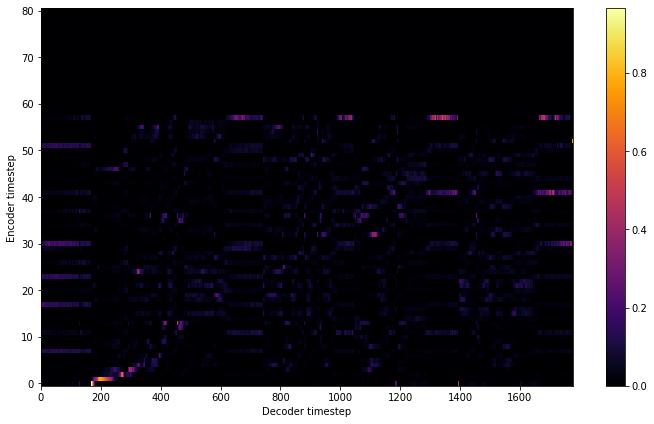

Saving model and optimizer state at iteration 1888 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 236 Iteration: 1888


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 236 Validation loss 1896:  0.273723  Time: 1.0m LR: 0.000500


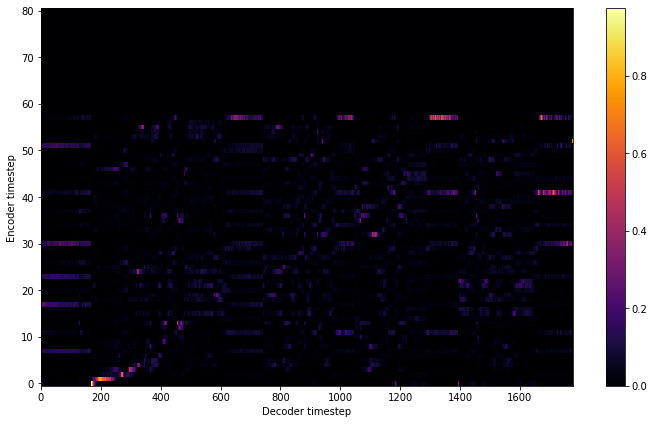

Saving model and optimizer state at iteration 1896 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 237 Iteration: 1896


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 237 Validation loss 1904:  0.260524  Time: 1.0m LR: 0.000500


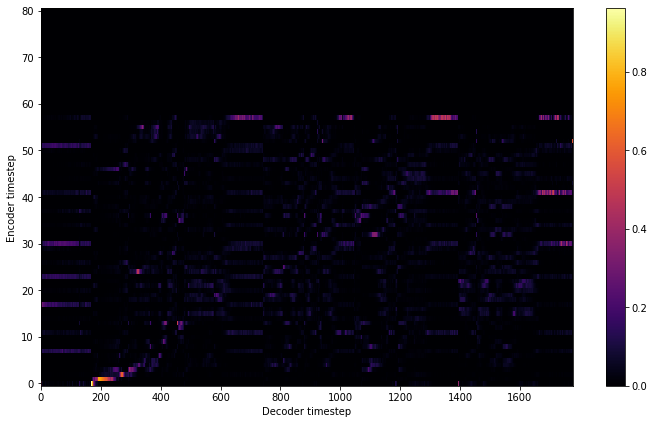

Saving model and optimizer state at iteration 1904 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 238 Iteration: 1904


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 238 Validation loss 1912:  0.254402  Time: 1.0m LR: 0.000500


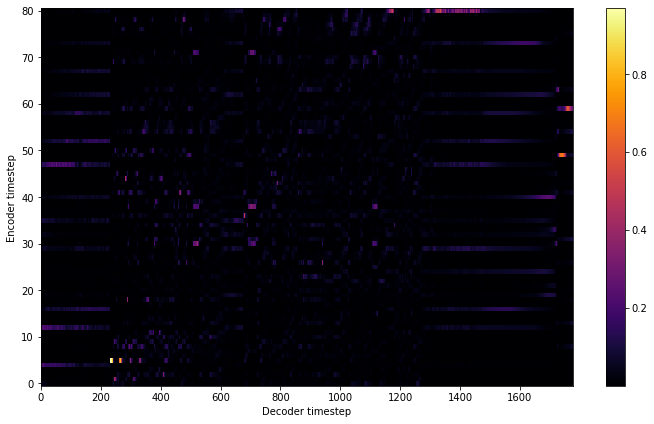

Saving model and optimizer state at iteration 1912 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 239 Iteration: 1912


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 239 Validation loss 1920:  0.262997  Time: 1.0m LR: 0.000500


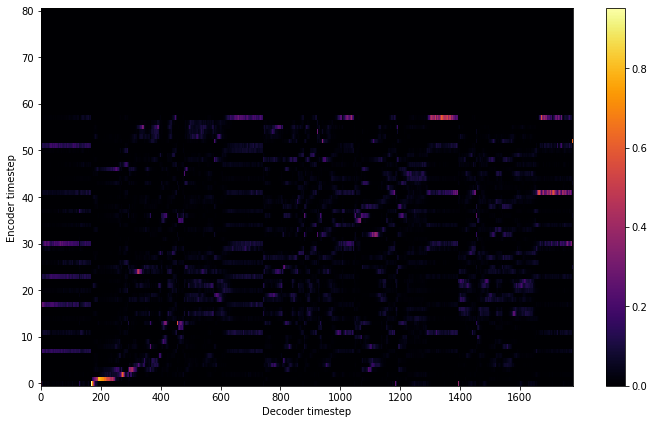

Saving model and optimizer state at iteration 1920 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 240 Iteration: 1920


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 240 Validation loss 1928:  0.271222  Time: 1.0m LR: 0.000500


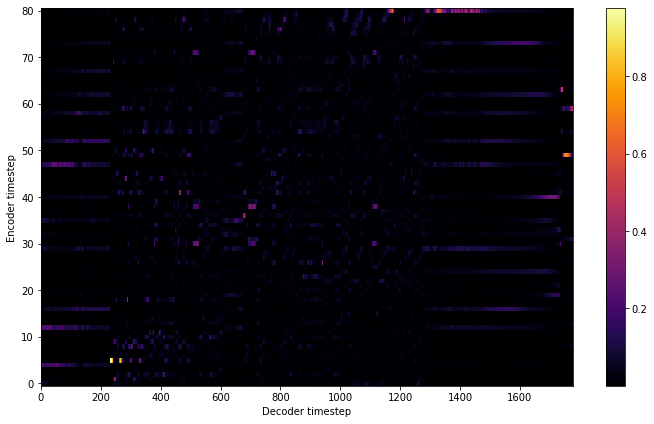

Saving model and optimizer state at iteration 1928 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 241 Iteration: 1928


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 241 Validation loss 1936:  0.264849  Time: 1.1m LR: 0.000500


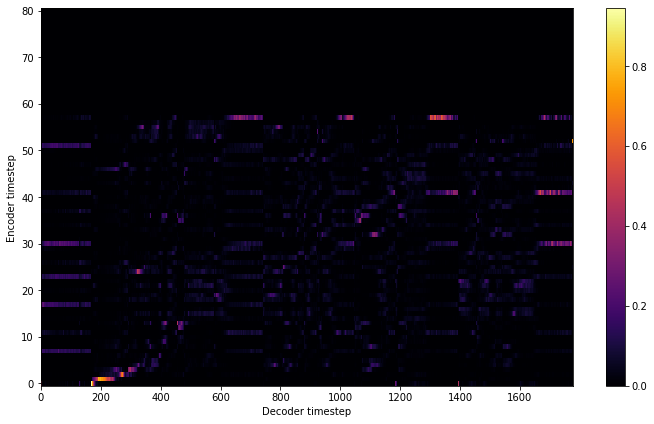

Saving model and optimizer state at iteration 1936 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 242 Iteration: 1936


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 242 Validation loss 1944:  0.266873  Time: 1.0m LR: 0.000500


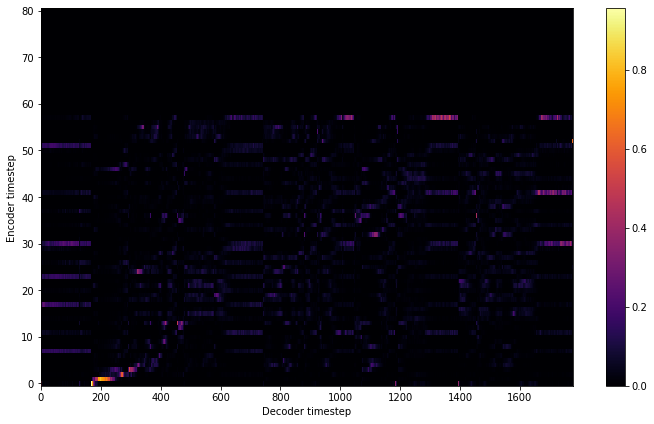

Saving model and optimizer state at iteration 1944 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 243 Iteration: 1944


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 243 Validation loss 1952:  0.274547  Time: 1.0m LR: 0.000500


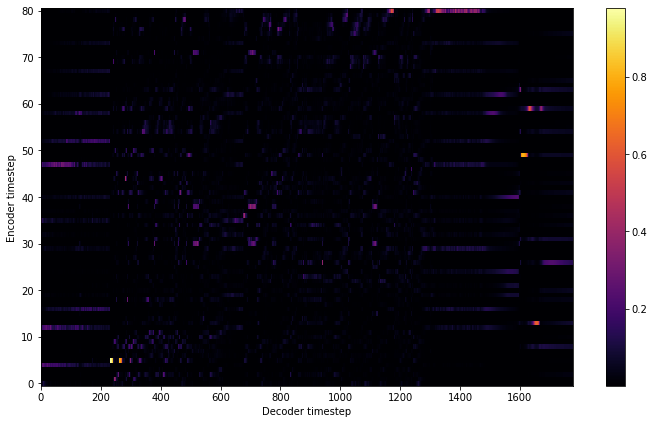

Saving model and optimizer state at iteration 1952 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 244 Iteration: 1952


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 244 Validation loss 1960:  0.270533  Time: 1.0m LR: 0.000500


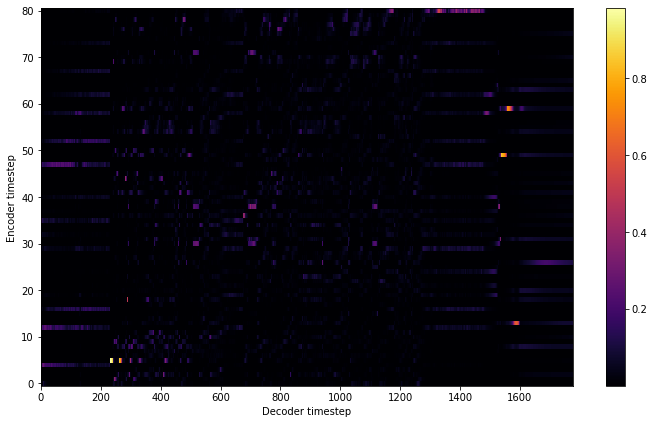

Saving model and optimizer state at iteration 1960 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 245 Iteration: 1960


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 245 Validation loss 1968:  0.262661  Time: 1.1m LR: 0.000500


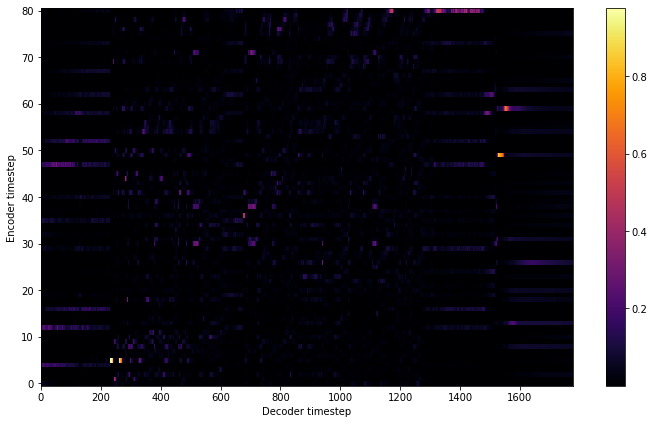

Saving model and optimizer state at iteration 1968 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 246 Iteration: 1968


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 246 Validation loss 1976:  0.261704  Time: 1.0m LR: 0.000500


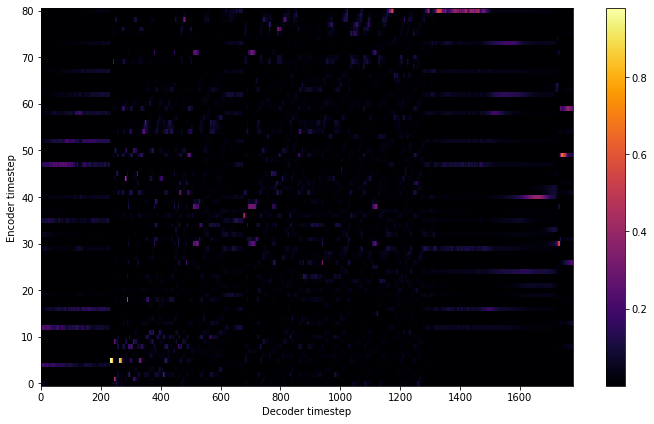

Saving model and optimizer state at iteration 1976 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 247 Iteration: 1976


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 247 Validation loss 1984:  0.256254  Time: 1.0m LR: 0.000500


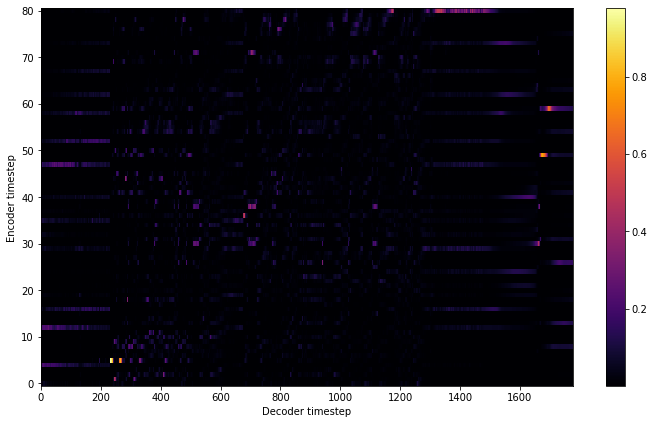

Saving model and optimizer state at iteration 1984 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 248 Iteration: 1984


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 248 Validation loss 1992:  0.258006  Time: 1.0m LR: 0.000500


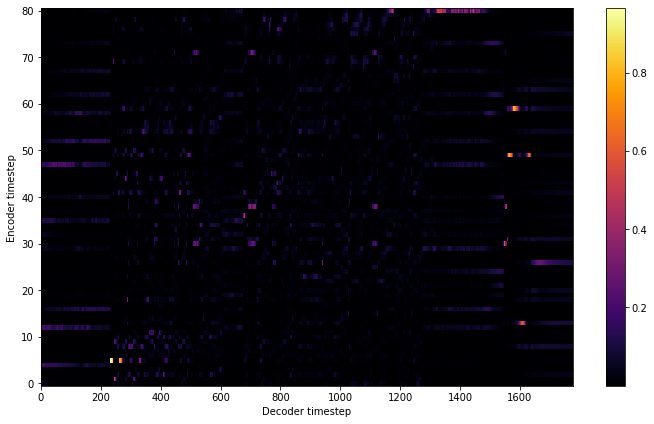

Saving model and optimizer state at iteration 1992 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 249 Iteration: 1992


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 249 Validation loss 2000:  0.260342  Time: 1.0m LR: 0.000500


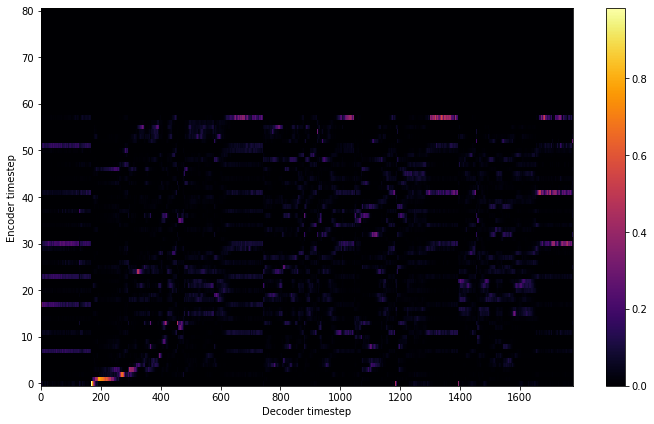

Saving model and optimizer state at iteration 2000 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 250 Iteration: 2000


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 250 Validation loss 2008:  0.265472  Time: 1.0m LR: 0.000500


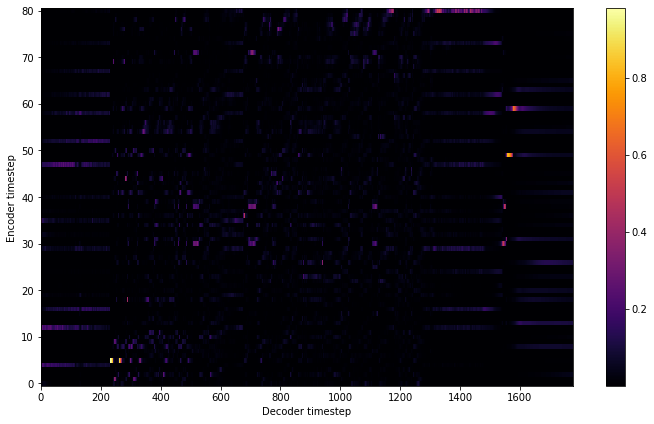

Saving model and optimizer state at iteration 2008 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 251 Iteration: 2008


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 251 Validation loss 2016:  0.263523  Time: 1.1m LR: 0.000500


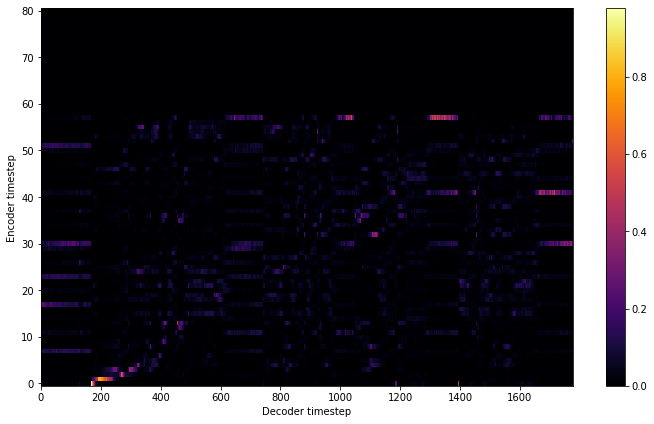

Saving model and optimizer state at iteration 2016 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 252 Iteration: 2016


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 252 Validation loss 2024:  0.258914  Time: 1.0m LR: 0.000500


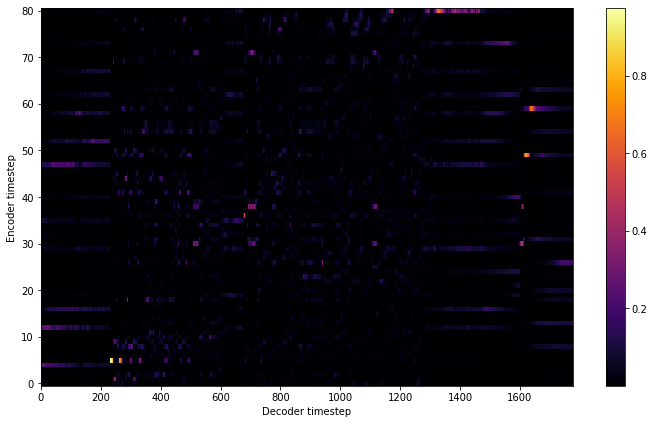

Saving model and optimizer state at iteration 2024 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 253 Iteration: 2024


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 253 Validation loss 2032:  0.265642  Time: 1.0m LR: 0.000500


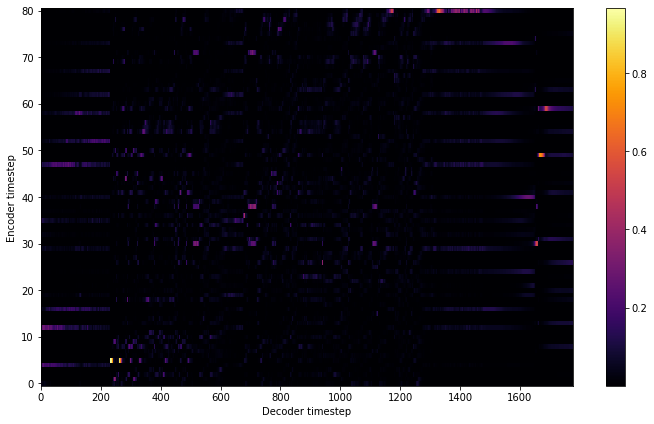

Saving model and optimizer state at iteration 2032 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 254 Iteration: 2032


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 254 Validation loss 2040:  0.262677  Time: 1.0m LR: 0.000500


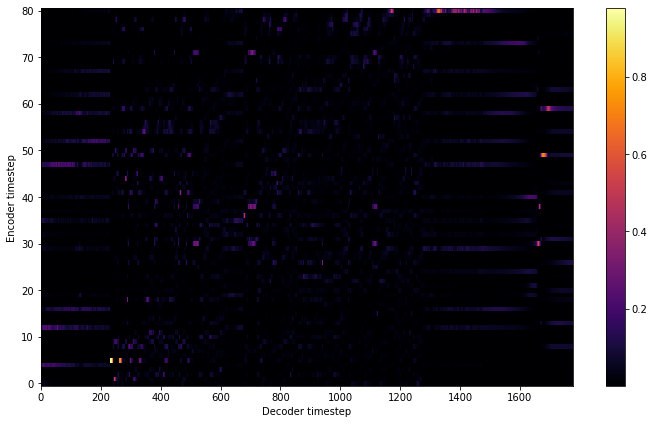

Saving model and optimizer state at iteration 2040 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 255 Iteration: 2040


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 255 Validation loss 2048:  0.264329  Time: 1.0m LR: 0.000500


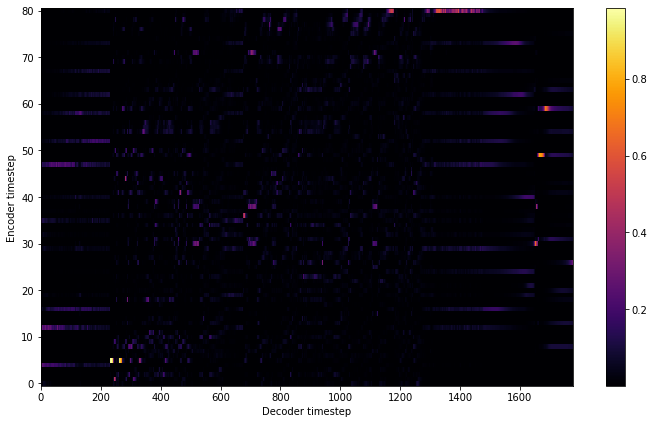

Saving model and optimizer state at iteration 2048 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 256 Iteration: 2048


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 256 Validation loss 2056:  0.259108  Time: 1.0m LR: 0.000500


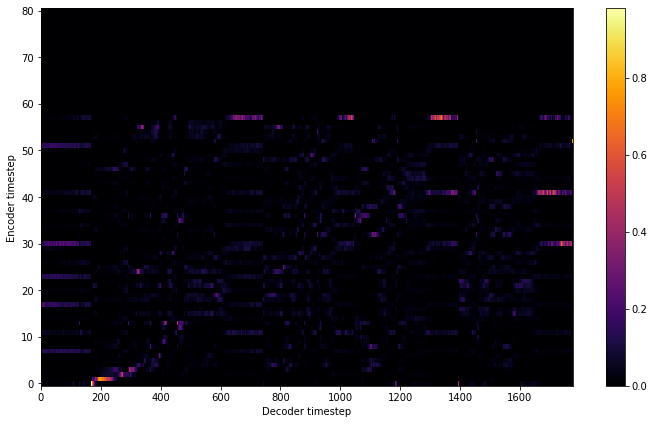

Saving model and optimizer state at iteration 2056 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 257 Iteration: 2056


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 257 Validation loss 2064:  0.252034  Time: 1.1m LR: 0.000500


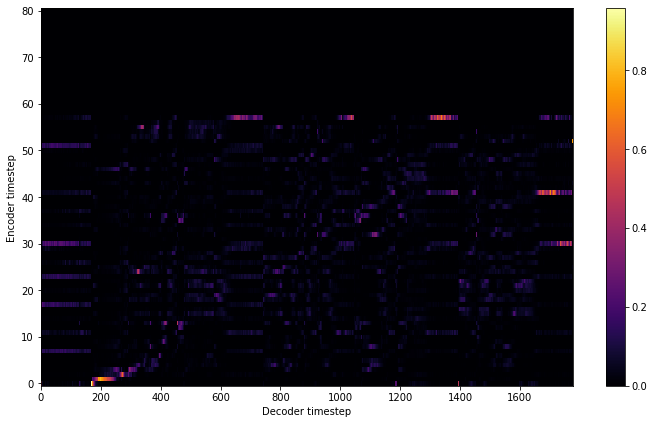

Saving model and optimizer state at iteration 2064 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 258 Iteration: 2064


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 258 Validation loss 2072:  0.251144  Time: 1.0m LR: 0.000500


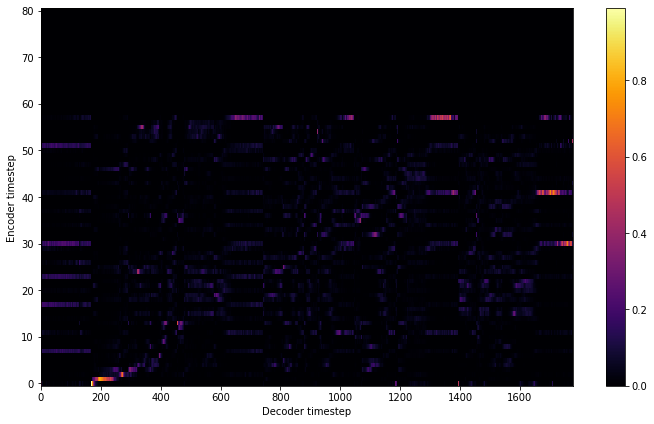

Saving model and optimizer state at iteration 2072 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 259 Iteration: 2072


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 259 Validation loss 2080:  0.245867  Time: 1.0m LR: 0.000500


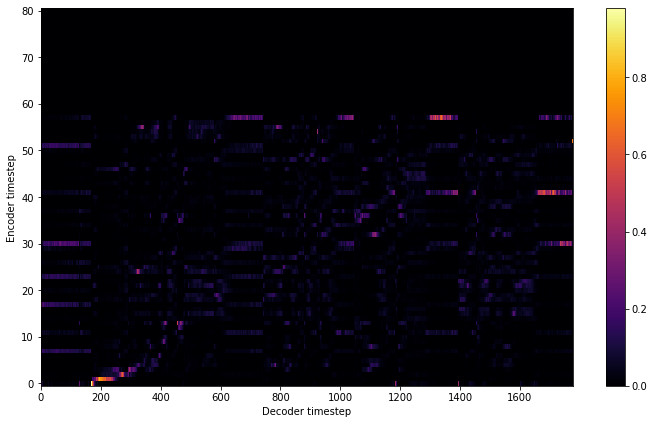

Saving model and optimizer state at iteration 2080 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 260 Iteration: 2080


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 260 Validation loss 2088:  0.248829  Time: 1.0m LR: 0.000500


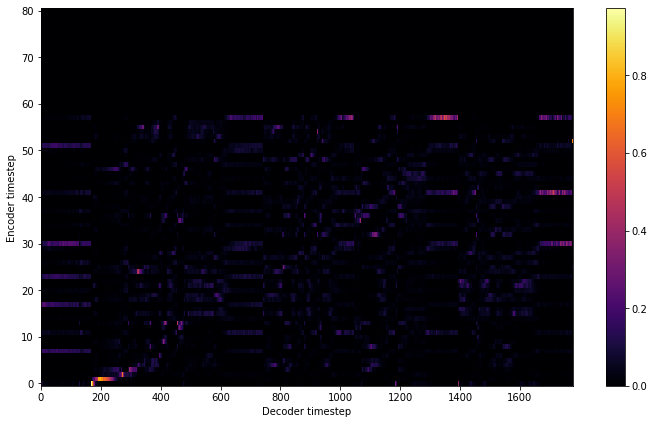

Saving model and optimizer state at iteration 2088 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 261 Iteration: 2088


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 261 Validation loss 2096:  0.244984  Time: 1.0m LR: 0.000500


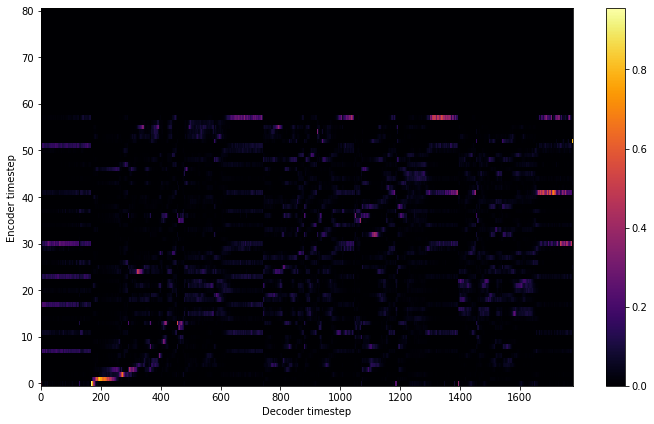

Saving model and optimizer state at iteration 2096 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 262 Iteration: 2096


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 262 Validation loss 2104:  0.245149  Time: 1.0m LR: 0.000500


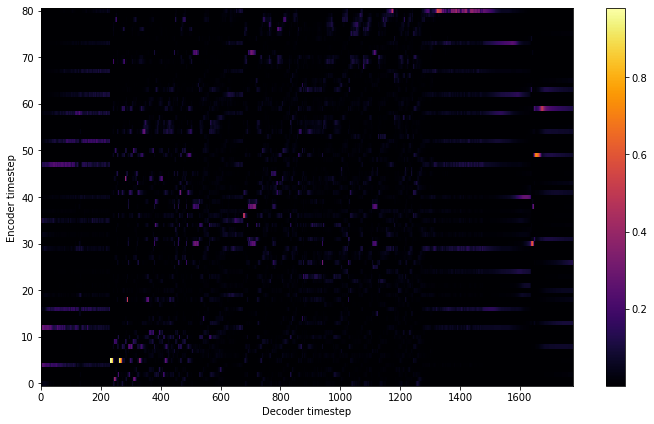

Saving model and optimizer state at iteration 2104 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 263 Iteration: 2104


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 263 Validation loss 2112:  0.248257  Time: 1.0m LR: 0.000500


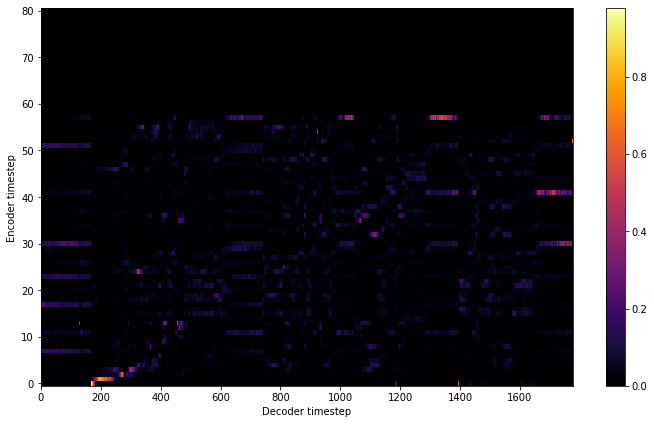

Saving model and optimizer state at iteration 2112 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 264 Iteration: 2112


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 264 Validation loss 2120:  0.264659  Time: 1.0m LR: 0.000500


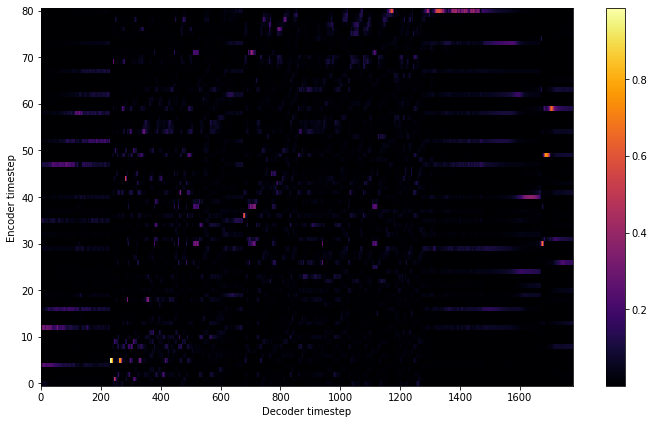

Saving model and optimizer state at iteration 2120 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 265 Iteration: 2120


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 265 Validation loss 2128:  0.257254  Time: 1.0m LR: 0.000500


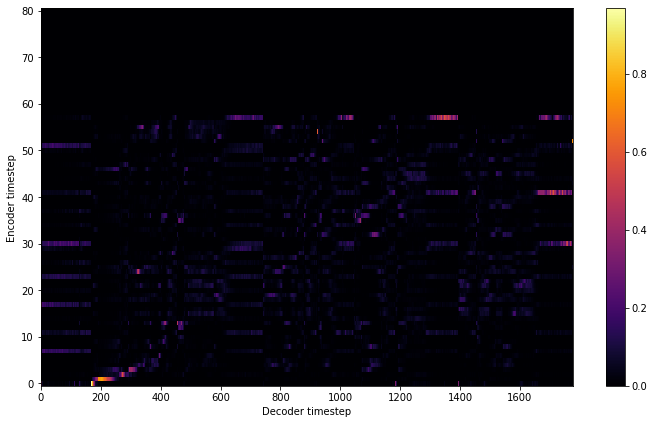

Saving model and optimizer state at iteration 2128 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 266 Iteration: 2128


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 266 Validation loss 2136:  0.248148  Time: 1.0m LR: 0.000500


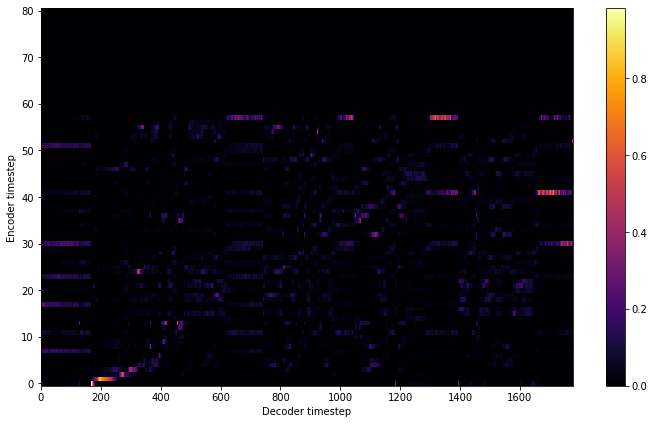

Saving model and optimizer state at iteration 2136 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 267 Iteration: 2136


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 267 Validation loss 2144:  0.244497  Time: 1.0m LR: 0.000500


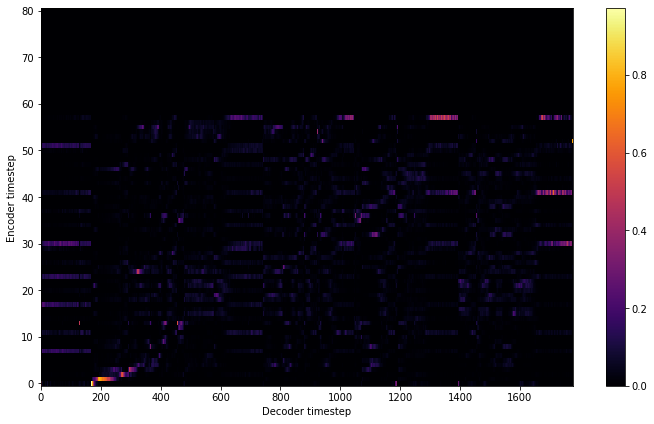

Saving model and optimizer state at iteration 2144 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 268 Iteration: 2144


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 268 Validation loss 2152:  0.246451  Time: 1.0m LR: 0.000500


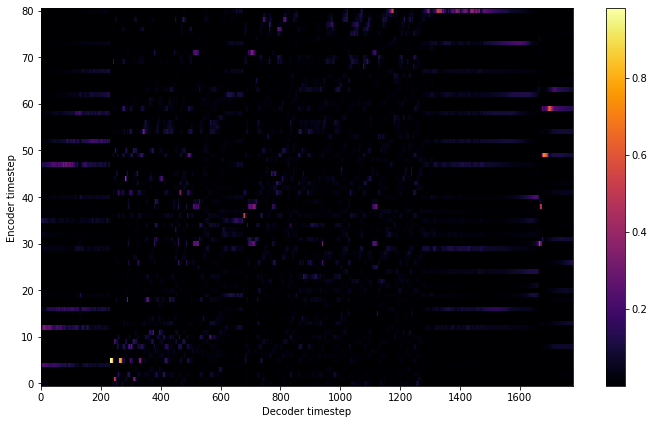

Saving model and optimizer state at iteration 2152 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 269 Iteration: 2152


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 269 Validation loss 2160:  0.247618  Time: 1.0m LR: 0.000500


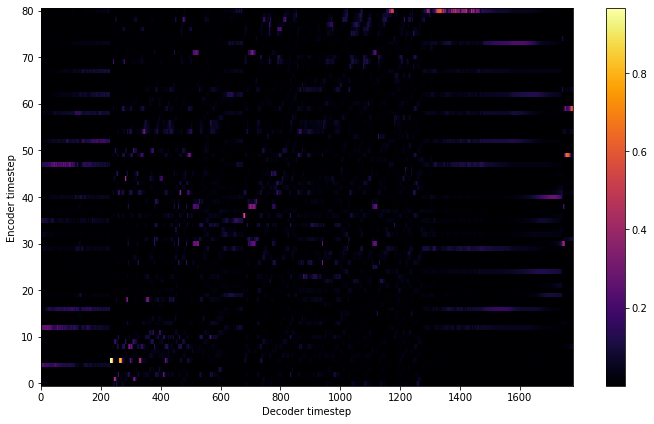

Saving model and optimizer state at iteration 2160 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 270 Iteration: 2160


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 270 Validation loss 2168:  0.244403  Time: 1.0m LR: 0.000500


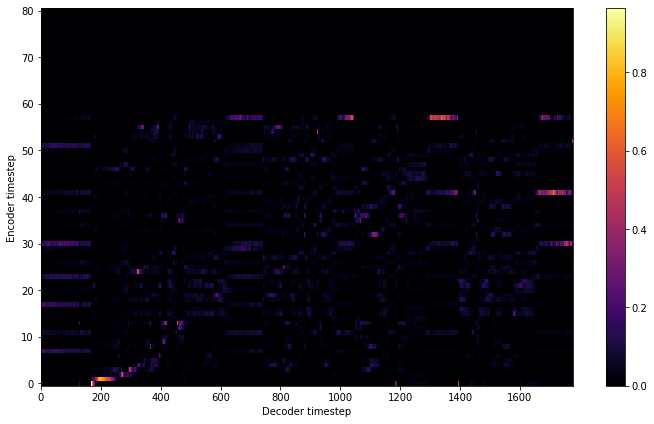

Saving model and optimizer state at iteration 2168 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 271 Iteration: 2168


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 271 Validation loss 2176:  0.245877  Time: 1.1m LR: 0.000500


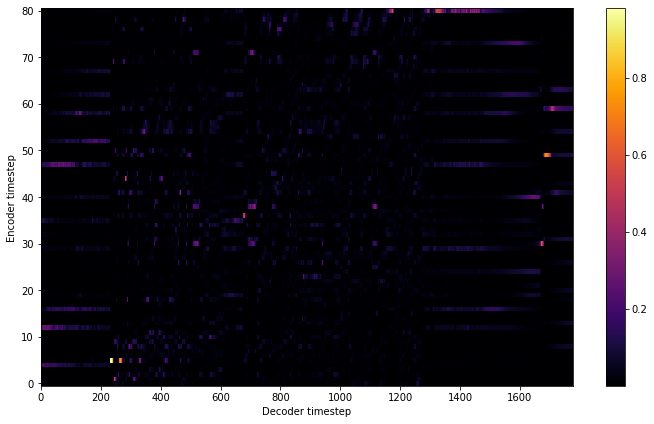

Saving model and optimizer state at iteration 2176 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 272 Iteration: 2176


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 272 Validation loss 2184:  0.250236  Time: 1.1m LR: 0.000500


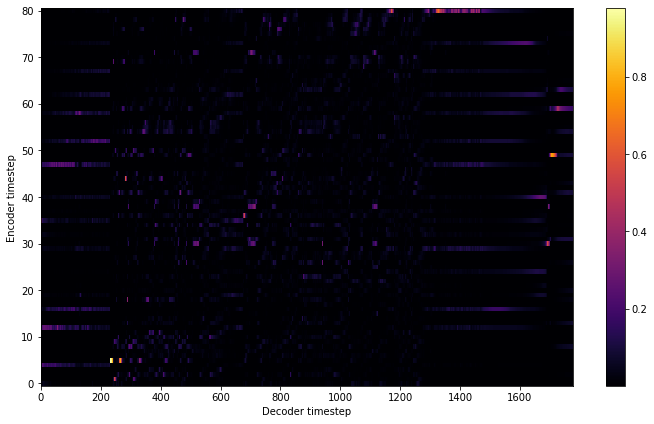

Saving model and optimizer state at iteration 2184 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 273 Iteration: 2184


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 273 Validation loss 2192:  0.244664  Time: 1.1m LR: 0.000500


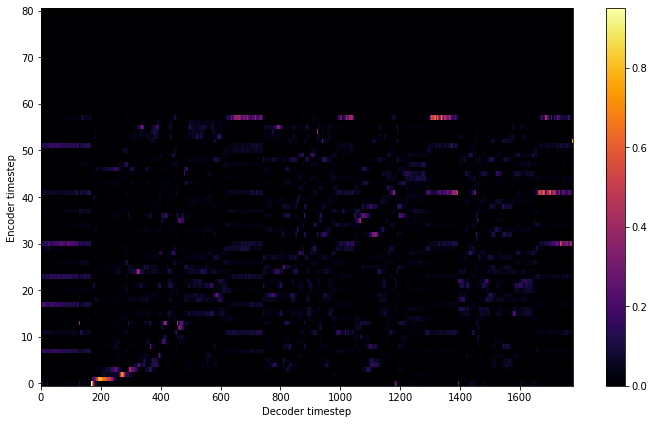

Saving model and optimizer state at iteration 2192 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 274 Iteration: 2192


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 274 Validation loss 2200:  0.243296  Time: 1.0m LR: 0.000500


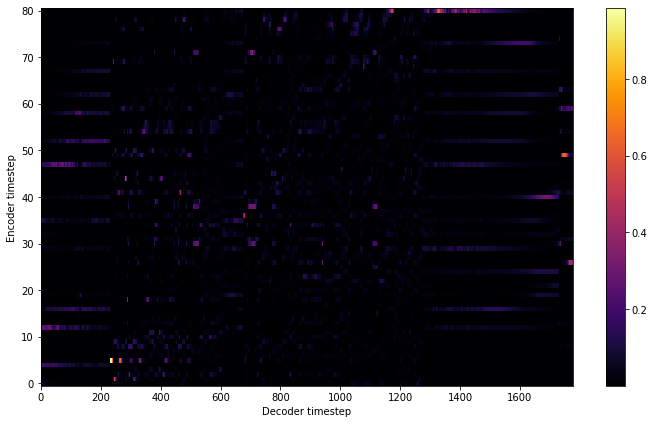

Saving model and optimizer state at iteration 2200 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 275 Iteration: 2200


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 275 Validation loss 2208:  0.241197  Time: 1.1m LR: 0.000500


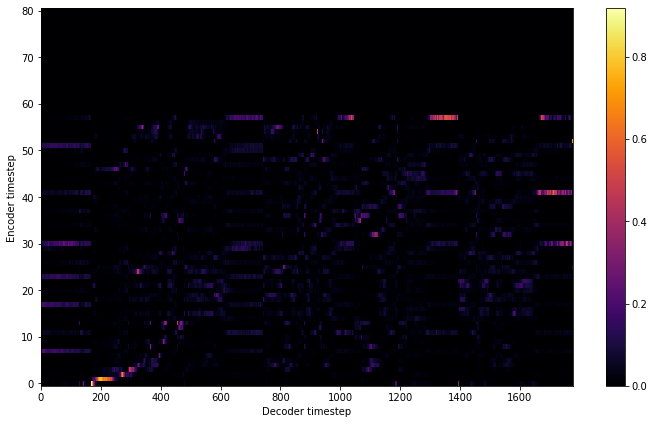

Saving model and optimizer state at iteration 2208 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 276 Iteration: 2208


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 276 Validation loss 2216:  0.239117  Time: 1.0m LR: 0.000500


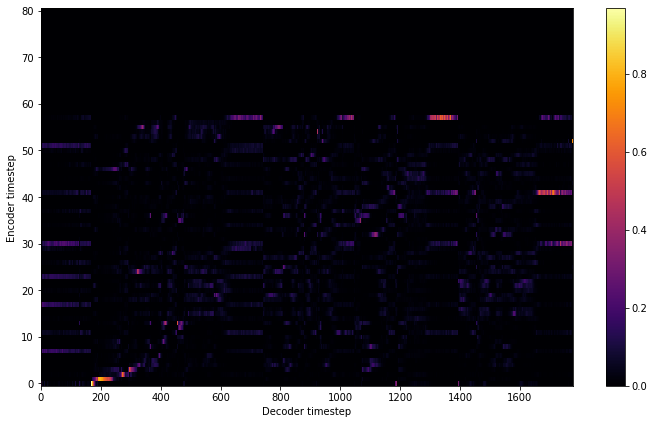

Saving model and optimizer state at iteration 2216 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 277 Iteration: 2216


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 277 Validation loss 2224:  0.245367  Time: 1.0m LR: 0.000500


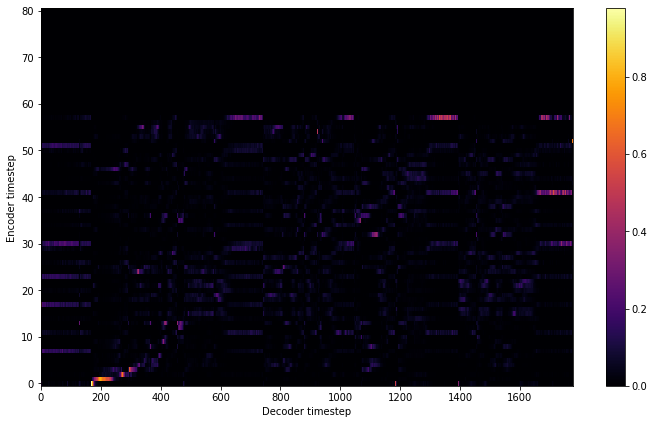

Saving model and optimizer state at iteration 2224 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 278 Iteration: 2224


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 278 Validation loss 2232:  0.243203  Time: 1.0m LR: 0.000500


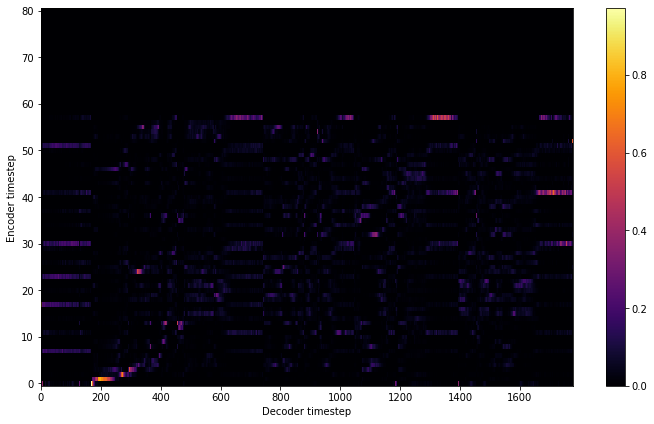

Saving model and optimizer state at iteration 2232 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 279 Iteration: 2232


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 279 Validation loss 2240:  0.247568  Time: 1.0m LR: 0.000500


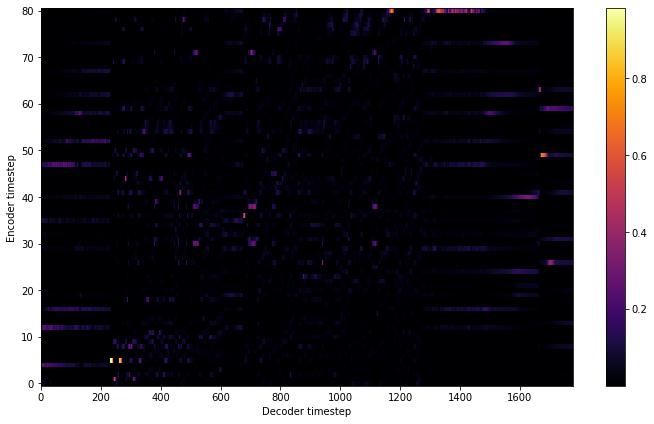

Saving model and optimizer state at iteration 2240 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 280 Iteration: 2240


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 280 Validation loss 2248:  0.246373  Time: 1.0m LR: 0.000500


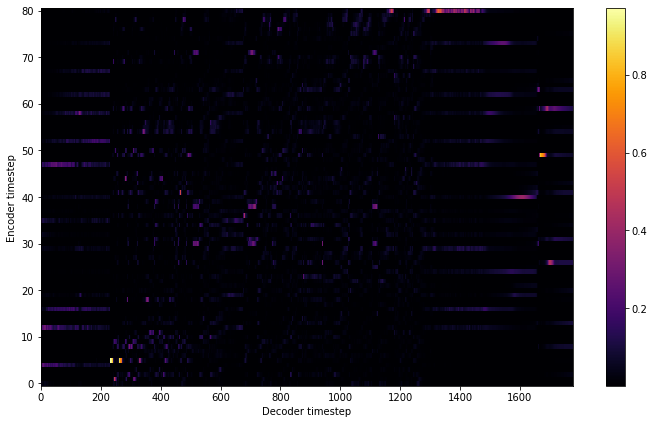

Saving model and optimizer state at iteration 2248 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 281 Iteration: 2248


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 281 Validation loss 2256:  0.245360  Time: 1.0m LR: 0.000500


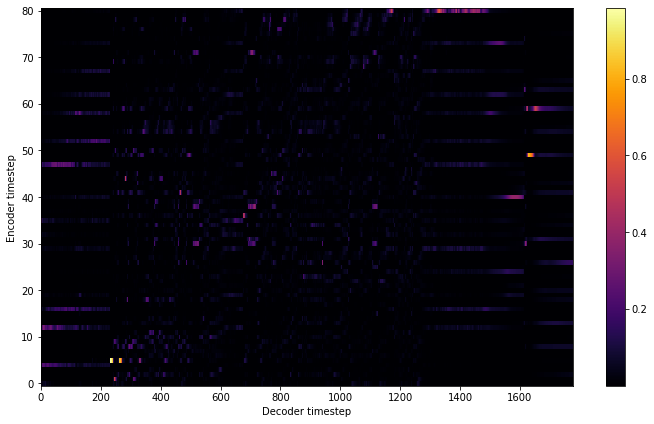

Saving model and optimizer state at iteration 2256 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 282 Iteration: 2256


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 282 Validation loss 2264:  0.244308  Time: 1.0m LR: 0.000500


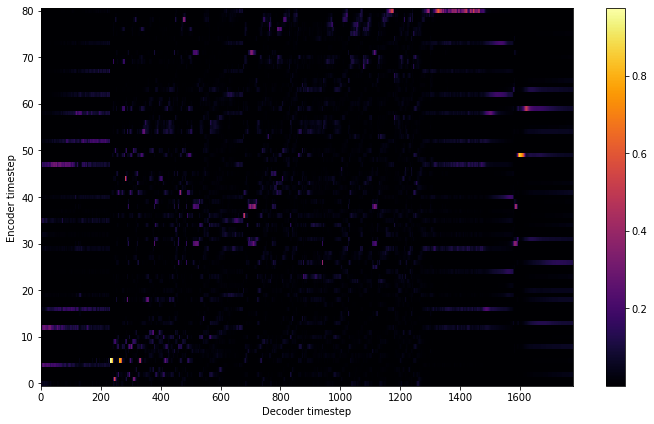

Saving model and optimizer state at iteration 2264 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 283 Iteration: 2264


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 283 Validation loss 2272:  0.245710  Time: 1.0m LR: 0.000500


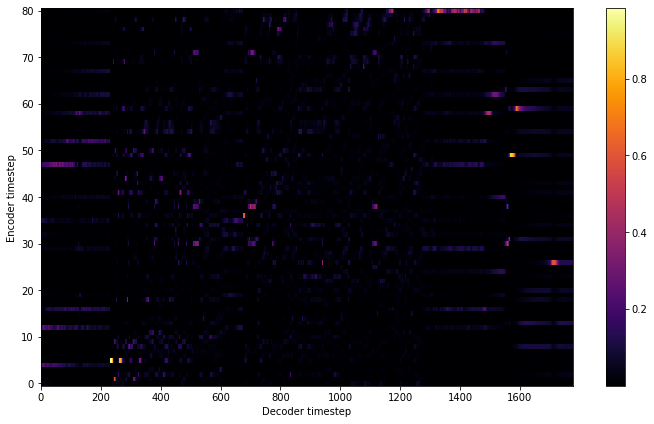

Saving model and optimizer state at iteration 2272 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 284 Iteration: 2272


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 284 Validation loss 2280:  0.243379  Time: 1.1m LR: 0.000500


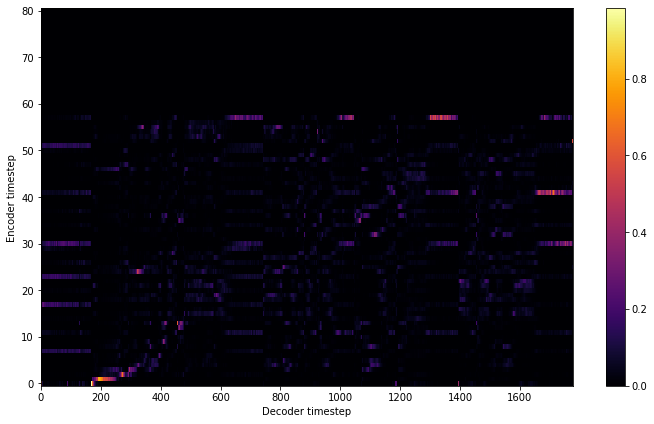

Saving model and optimizer state at iteration 2280 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 285 Iteration: 2280


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 285 Validation loss 2288:  0.243066  Time: 1.0m LR: 0.000500


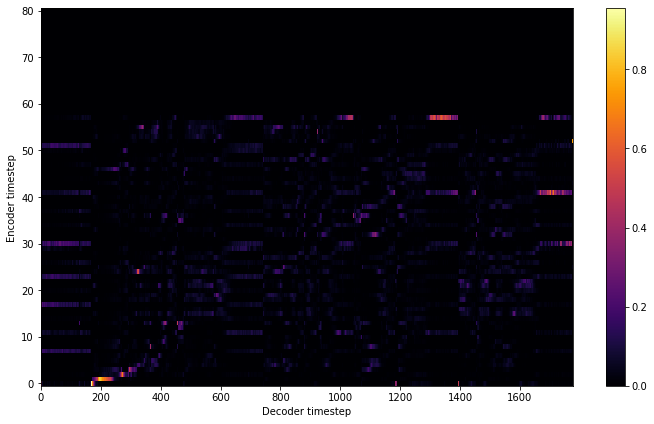

Saving model and optimizer state at iteration 2288 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 286 Iteration: 2288


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 286 Validation loss 2296:  0.248191  Time: 1.0m LR: 0.000500


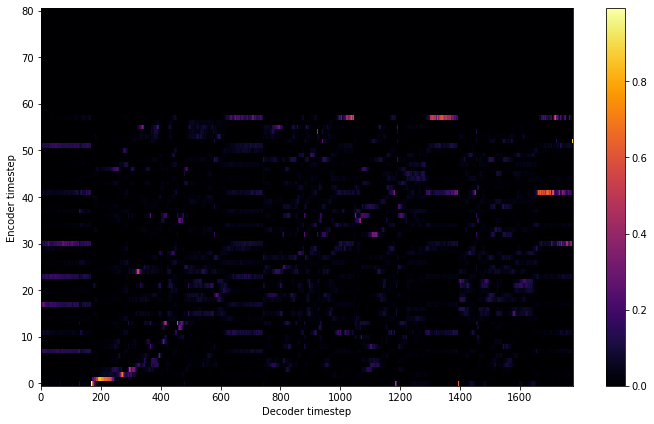

Saving model and optimizer state at iteration 2296 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 287 Iteration: 2296


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 287 Validation loss 2304:  0.240064  Time: 1.0m LR: 0.000500


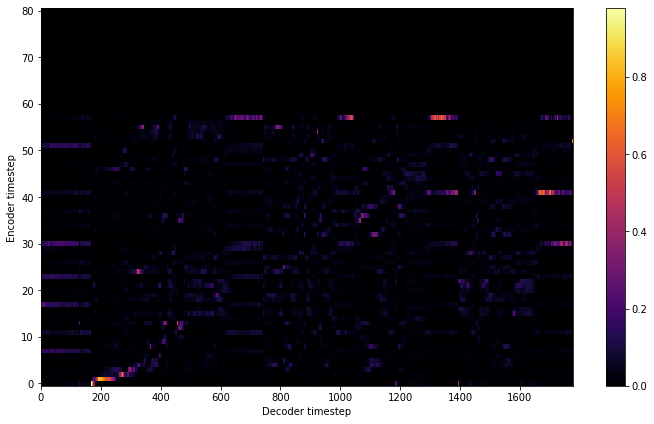

Saving model and optimizer state at iteration 2304 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 288 Iteration: 2304


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 288 Validation loss 2312:  0.242597  Time: 1.0m LR: 0.000500


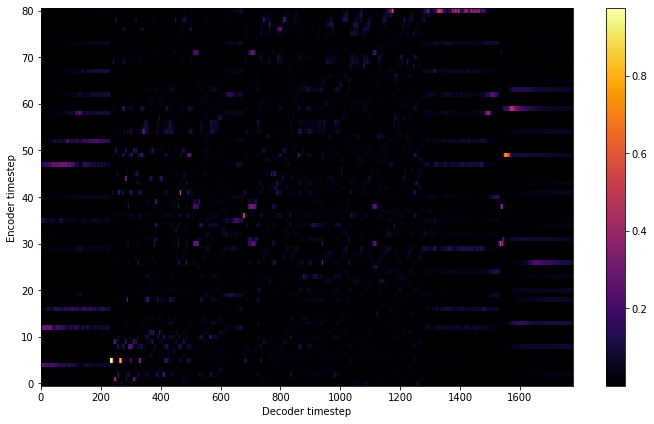

Saving model and optimizer state at iteration 2312 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 289 Iteration: 2312


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch: 289 Validation loss 2320:  0.239539  Time: 1.0m LR: 0.000500


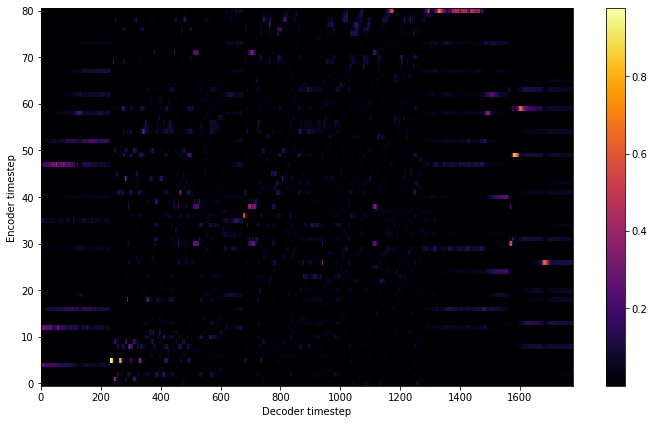

Saving model and optimizer state at iteration 2320 to /content/drive/My Drive/colab/outdir/Crinmatic
Model Saved

Starting Epoch: 290 Iteration: 2320


  0%|          | 0/8 [00:00<?, ?it/s]

In [ ]:
#@title Training
print('FP16 Run:', hparams.fp16_run)
print('Dynamic Loss Scaling:', hparams.dynamic_loss_scaling)
print('Distributed Run:', hparams.distributed_run)
print('cuDNN Enabled:', hparams.cudnn_enabled)
print('cuDNN Benchmark:', hparams.cudnn_benchmark)
train(output_directory, log_directory, checkpoint_path,
      warm_start, n_gpus, rank, group_name, hparams, log_directory2)

In [ ]:
22#!cd /content/drive/MyDrive/"Speech Recognition"/tacotron2/hifi-gan
!pwd

Current Config:
pronounciation_dictionary: False
show_graphs: True
max_duration (in seconds): 25
stop_threshold: 0.324


Enter/Paste your text.
--------------------------------------------------
Warning! Reached max decoder steps


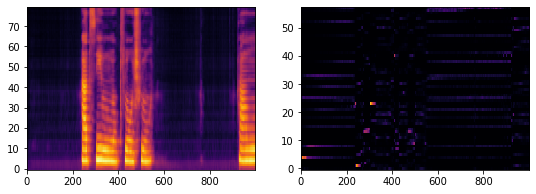

--------------------------------------------------
Warning! Reached max decoder steps


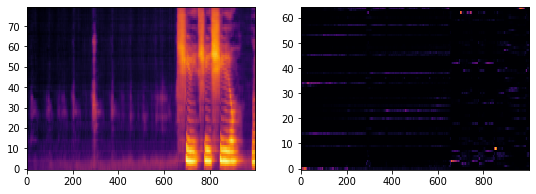

--------------------------------------------------
Warning! Reached max decoder steps


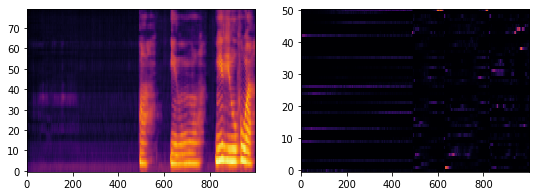

--------------------------------------------------
Warning! Reached max decoder steps


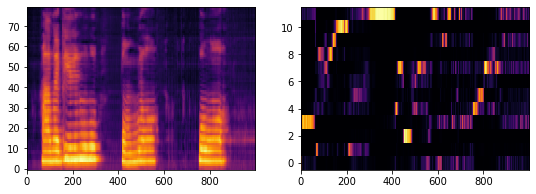

--------------------------------------------------
Warning! Reached max decoder steps


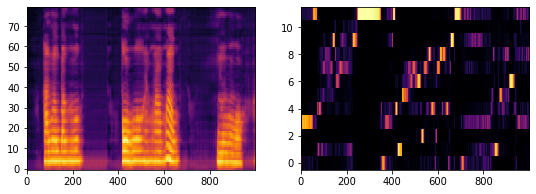

--------------------------------------------------
Warning! Reached max decoder steps


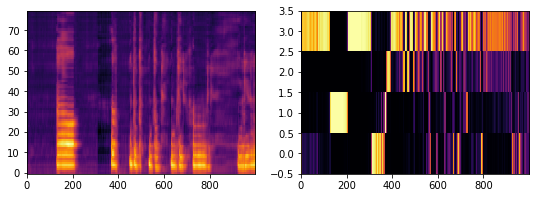

--------------------------------------------------
Warning! Reached max decoder steps


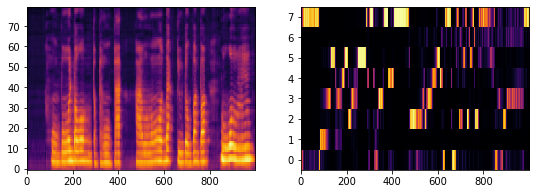

--------------------------------------------------
Warning! Reached max decoder steps


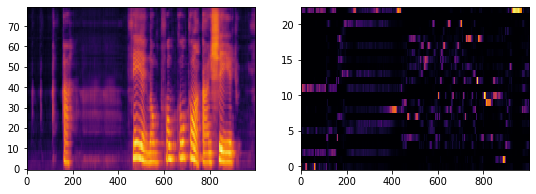

--------------------------------------------------
Warning! Reached max decoder steps


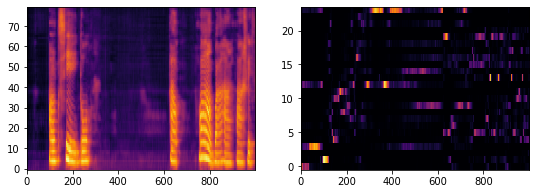

--------------------------------------------------
Warning! Reached max decoder steps


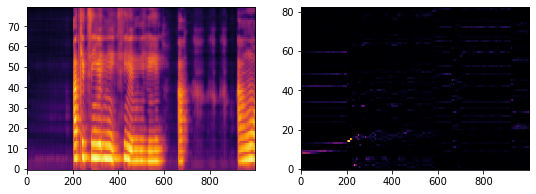

--------------------------------------------------


In [ ]:
#@markdown Config:

#@markdown Restart the code to apply any changes.

#Add new characters here.
#Universal HiFi-GAN (has some robotic noise): 1qpgI41wNXFcH-iKq1Y42JlBC9j0je8PW
Tacotron2_Model = '1-MAgEh82SNFfY8mRreBgai0qZ1YHO3Ye'#@param {type:"string"}
TACOTRON2_ID = Tacotron2_Model
HIFIGAN_ID = "1qpgI41wNXFcH-iKq1Y42JlBC9j0je8PW"

# Check if Initilized
try:
    initilized
except NameError:
    print("Setting up, please wait.\n")
    !pip install tqdm -q
    from tqdm.notebook import tqdm
    with tqdm(total=5, leave=False) as pbar:
       
        import os
        from os.path import exists, join, basename, splitext
        !pip install gdown
        git_repo_url = 'https://github.com/NVIDIA/tacotron2.git'
        project_name = splitext(basename(git_repo_url))[0]
        if not exists(project_name):
            # clone and install
            !git clone -q --recursive {git_repo_url}
            !git clone -q --recursive https://github.com/SortAnon/hifi-gan
            !pip install -q librosa unidecode
        pbar.update(1) # downloaded TT2 and HiFi-GAN
        import sys
        sys.path.append('hifi-gan')
        sys.path.append(project_name)
        import time
        import matplotlib
        import matplotlib.pylab as plt
        import gdown
        d = 'https://drive.google.com/uc?id='

        %matplotlib inline
        import IPython.display as ipd
        import numpy as np
        import torch
        import json
        from hparams import create_hparams
        from model import Tacotron2
        from layers import TacotronSTFT
        from audio_processing import griffin_lim
        from text import text_to_sequence
        from env import AttrDict
        from meldataset import MAX_WAV_VALUE
        from models import Generator

        pbar.update(1) # initialized Dependancies

        graph_width = 900
        graph_height = 360
        def plot_data(data, figsize=(int(graph_width/100), int(graph_height/100))):
            %matplotlib inline
            fig, axes = plt.subplots(1, len(data), figsize=figsize)
            for i in range(len(data)):
                axes[i].imshow(data[i], aspect='auto', origin='bottom', 
                            interpolation='none', cmap='inferno')
            fig.canvas.draw()
            plt.show()

        # Setup Pronounciation Dictionary
        !gdown --id '1E12g_sREdcH5vuZb44EZYX8JjGWQ9rRp'
        thisdict = {}
        for line in reversed((open('merged.dict.txt', "r").read()).splitlines()):
            thisdict[(line.split(" ",1))[0]] = (line.split(" ",1))[1].strip()

        pbar.update(1) # Downloaded and Set up Pronounciation Dictionary

        def ARPA(text, punctuation=r"!?,.;", EOS_Token=True):
            out = ''
            for word_ in text.split(" "):
                word=word_; end_chars = ''
                while any(elem in word for elem in punctuation) and len(word) > 1:
                    if word[-1] in punctuation: end_chars = word[-1] + end_chars; word = word[:-1]
                    else: break
                try:
                    word_arpa = thisdict[word.upper()]
                    word = "{" + str(word_arpa) + "}"
                except KeyError: pass
                out = (out + " " + word + end_chars).strip()
            if EOS_Token and out[-1] != ";": out += ";"
            return out

        def get_hifigan(MODEL_ID):
            # Download HiFi-GAN
            hifigan_pretrained_model = 'hifimodel'
            gdown.download(d+MODEL_ID, hifigan_pretrained_model, quiet=False)
            if not exists(hifigan_pretrained_model):
                raise Exception("HiFI-GAN model failed to download!")

            # Load HiFi-GAN
            conf = os.path.join("hifi-gan", "config_v1.json")
            with open(conf) as f:
                json_config = json.loads(f.read())
            h = AttrDict(json_config)
            torch.manual_seed(h.seed)
            hifigan = Generator(h).to(torch.device("cuda"))
            state_dict_g = torch.load(hifigan_pretrained_model, map_location=torch.device("cuda"))
            hifigan.load_state_dict(state_dict_g["generator"])
            hifigan.eval()
            hifigan.remove_weight_norm()
            return hifigan, h

        hifigan, h = get_hifigan(HIFIGAN_ID)
        pbar.update(1) # Downloaded and Set up HiFi-GAN

        def has_MMI(STATE_DICT):
            return any(True for x in STATE_DICT.keys() if "mi." in x)

        def get_Tactron2(MODEL_ID):
            # Download Tacotron2
            tacotron2_pretrained_model = "/content/drive/MyDrive/colab/outdir/Crinmatic"
            if not exists(tacotron2_pretrained_model):
                raise Exception("Tacotron2 model failed to download!")
            # Load Tacotron2 and Config
            hparams = create_hparams()
            hparams.sampling_rate = 22050
            hparams.max_decoder_steps = 3000 # Max Duration
            hparams.gate_threshold = 0.25 # Model must be 25% sure the clip is over before ending generation
            model = Tacotron2(hparams)
            state_dict = torch.load(tacotron2_pretrained_model)['state_dict']
            if has_MMI(state_dict):
                raise Exception("ERROR: This notebook does not currently support MMI models.")
            model.load_state_dict(state_dict)
            _ = model.cuda().eval().half()
            return model, hparams

        model, hparams = get_Tactron2(TACOTRON2_ID)
        previous_tt2_id = TACOTRON2_ID

        pbar.update(1) # Downloaded and Set up Tacotron2

        # Extra Info
        def end_to_end_infer(text, pronounciation_dictionary, show_graphs):
            for i in [x for x in text.split("\n") if len(x)]:
                if not pronounciation_dictionary:
                    if i[-1] != ";": i=i+";" 
                else: i = ARPA(i)
                with torch.no_grad(): # save VRAM by not including gradients
                    sequence = np.array(text_to_sequence(i, ['transliteration_cleaners']))[None, :]
                    sequence = torch.autograd.Variable(torch.from_numpy(sequence)).cuda().long()
                    mel_outputs, mel_outputs_postnet, _, alignments = model.inference(sequence)
                    if show_graphs:
                        plot_data((mel_outputs_postnet.float().data.cpu().numpy()[0],
                                alignments.float().data.cpu().numpy()[0].T))
                    y_g_hat = hifigan(mel_outputs_postnet.float())
                    audio = y_g_hat.squeeze()
                    audio = audio * MAX_WAV_VALUE
                    print("")
                    ipd.display(ipd.Audio(audio.cpu().numpy().astype("int16"), rate=hparams.sampling_rate))
    from IPython.display import clear_output
    clear_output()
    initilized = "Ready"

if previous_tt2_id != TACOTRON2_ID:
    print("Updating Models")
    model, hparams = get_Tactron2(TACOTRON2_ID)
    hifigan, h = get_hifigan(HIFIGAN_ID)
    previous_tt2_id = TACOTRON2_ID

pronounciation_dictionary = False #@param {type:"boolean"}
# disables automatic ARPAbet conversion, useful for inputting your own ARPAbet pronounciations or just for testing
show_graphs = True #@param {type:"boolean"}
max_duration = 25 #this does nothing
model.decoder.max_decoder_steps = 1000 #@param {type:"integer"}
stop_threshold = 0.324 #@param {type:"number"}
model.decoder.gate_threshold = stop_threshold

#@markdown ---

print(f"Current Config:\npronounciation_dictionary: {pronounciation_dictionary}\nshow_graphs: {show_graphs}\nmax_duration (in seconds): {max_duration}\nstop_threshold: {stop_threshold}\n\n")

time.sleep(1)
print("Enter/Paste your text.")
contents = []
while True:
    try:
        print("-"*50)
        line = input()
        if line == "":
            continue
        end_to_end_infer(line, pronounciation_dictionary, show_graphs)
    except EOFError:
        break
    except KeyboardInterrupt:
        print("Stopping...")
        break

In [ ]:
import os
from os.path import exists, join, basename, splitext
!pip install gdown
git_repo_url = 'https://github.com/NVIDIA/tacotron2.git'
project_name = splitext(basename(git_repo_url))[0]
if not exists(project_name):
  # clone and install
  !git clone -q --recursive {git_repo_url}
  !cd {project_name}/waveglow && git checkout 2fd4e63
  !pip install -q librosa unidecode
  
import sys
sys.path.append(join(project_name, 'waveglow/'))
sys.path.append(project_name)
import time
import matplotlib
import matplotlib.pylab as plt
import gdown
d = 'https://drive.google.com/uc?id='

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#@title Load Pretrained Models
force_download_TT2 = True
tacotron2_pretrained_model = '/content/drive/MyDrive/colab/outdir/Crinmatic'#@param {type:"string"}
waveglow_pretrained_model = '/content/drive/MyDrive/Speech Recognition/tacotron2/waveglow_256channels_ljs_v2.pt'#@param {type:"string"}

In [ ]:
#Initialize Tacotron and Waveglow 
%matplotlib inline
import IPython.display as ipd
import numpy as np
import torch

from hparams import create_hparams
from model import Tacotron2
from layers import TacotronSTFT
from audio_processing import griffin_lim
from text import text_to_sequence
from denoiser import Denoiser

graph_width = 900
graph_height = 360
def plot_data(data, figsize=(int(graph_width/100), int(graph_height/100))):
    %matplotlib inline
    fig, axes = plt.subplots(1, len(data), figsize=figsize)
    for i in range(len(data)):
        axes[i].imshow(data[i], aspect='auto', origin='bottom', 
                       interpolation='none', cmap='inferno')
    fig.canvas.draw()
    plt.show()

!gdown --id '1J_l0Qs_gDBAc1jSwdvxJmfW7L5BaUjxY'
thisdict = {}
for line in reversed((open('merged.dict.txt', "r").read()).splitlines()):
    thisdict[(line.split(" ",1))[0]] = (line.split(" ",1))[1].strip()
def ARPA(text):
    out = ''
    for word_ in text.split(" "):
        word=word_; end_chars = ''
        while any(elem in word for elem in r"!?,.;") and len(word) > 1:
            if word[-1] == '!': end_chars = '!' + end_chars; word = word[:-1]
            if word[-1] == '?': end_chars = '?' + end_chars; word = word[:-1]
            if word[-1] == ',': end_chars = ',' + end_chars; word = word[:-1]
            if word[-1] == '.': end_chars = '.' + end_chars; word = word[:-1]
            if word[-1] == ';': end_chars = ';' + end_chars; word = word[:-1]
            else: break
        try: word_arpa = thisdict[word.upper()]
        except: word_arpa = ''
        if len(word_arpa)!=0: word = "{" + str(word_arpa) + "}"
        out = (out + " " + word + end_chars).strip()
    if out[-1] != ";": out = out + ";"
    return out

#torch.set_grad_enabled(False)

# initialize Tacotron2 with the pretrained model
hparams = create_hparams()

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1J_l0Qs_gDBAc1jSwdvxJmfW7L5BaUjxY
To: /content/drive/MyDrive/Speech Recognition/tacotron2/waveglow_256channels_ljs_v2.pt
100% 676M/676M [00:03<00:00, 190MB/s]


In [ ]:
#Parameters
# Load Tacotron2 (run this cell every time you change the model)
hparams.sampling_rate = 48000 # Don't change this
hparams.max_decoder_steps = 1000 # How long the audio will be before it cuts off (1000 is about 11 seconds)
hparams.gate_threshold = 0.1 # Model must be 90% sure the clip is over before ending generation (the higher this number is, the more likely that the AI will keep generating until it reaches the Max Decoder Steps)
model = Tacotron2(hparams)
model.load_state_dict(torch.load(tacotron2_pretrained_model)['state_dict'])
_ = model.cuda().eval().half()

# Load WaveGlow
waveglow = torch.load(waveglow_pretrained_model)['model']
waveglow.cuda().eval().half()
for k in waveglow.convinv:
    k.float()
denoiser = Denoiser(waveglow)

Ilẹ̀kùn yàrá Tádé ti bàjẹ́.
Ilẹ̀kùn yàrá Tádé ti bàjẹ́.;
Warning! Reached max decoder steps


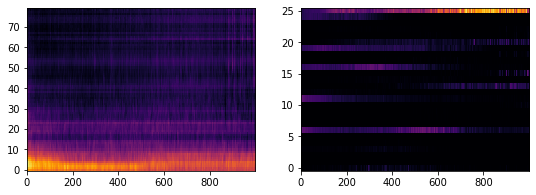

In [ ]:
#@title Let's Have Fun!
text = 'Il\u1EB9\u0300k\xF9n y\xE0r\xE1 T\xE1d\xE9 ti b\xE0j\u1EB9\u0301.'#@param {type:"string"}
sigma = 0.8
denoise_strength = 0.324
raw_input = True # disables automatic ARPAbet conversion, useful for inputting your own ARPAbet pronounciations or just for testing.
                  # should be True if synthesizing a non-English language

for i in text.split("\n"):
    if len(i) < 1: continue;
    print(i)
    if raw_input:
        if i[-1] != ";": i=i+";" 
    else: i = ARPA(i)
    print(i)
    with torch.no_grad(): # save VRAM by not including gradients
        sequence = np.array(text_to_sequence(i, ['transliteration_cleaners']))[None, :]
        sequence = torch.autograd.Variable(torch.from_numpy(sequence)).cuda().long()
        mel_outputs, mel_outputs_postnet, _, alignments = model.inference(sequence)
        plot_data((mel_outputs_postnet.float().data.cpu().numpy()[0],
                alignments.float().data.cpu().numpy()[0].T))
        audio = waveglow.infer(mel_outputs_postnet, sigma=sigma); print(""); ipd.display(ipd.Audio(audio[0].data.cpu().numpy(), rate=hparams.sampling_rate))

In [ ]:
!wget https://repo.sadilar.org/bitstream/handle/20.500.12185/431/yorubaspeechcorpus.zip?sequence=3&isAllowed=y

--2022-09-23 08:55:40--  https://repo.sadilar.org/bitstream/handle/20.500.12185/431/yorubaspeechcorpus.zip?sequence=3
Resolving repo.sadilar.org (repo.sadilar.org)... 143.160.58.167
Connecting to repo.sadilar.org (repo.sadilar.org)|143.160.58.167|:443... connected.
HTTP request sent, awaiting response... 200 
Length: 280564537 (268M) [application/zip]
Saving to: ‘yorubaspeechcorpus.zip?sequence=3’

yorubaspeechcorpus. 100%[===================>] 267.57M  11.7MB/s    in 24s     

2022-09-23 08:56:05 (11.2 MB/s) - ‘yorubaspeechcorpus.zip?sequence=3’ saved [280564537/280564537]



In [ ]:
https://drive.google.com/file/d/1J_l0Qs_gDBAc1jSwdvxJmfW7L5BaUjxY/view?usp=sharing